In [1]:
import os
import time
import numpy as np

from PIL import Image
from IPython import display
from IPython.display import Video
import matplotlib.pyplot as plt
import seaborn as sns
import moviepy.editor as mpy
from base64 import b64encode

import torch
from torch import nn
import torchvision
from torchvision import transforms
from torchvision.transforms.functional import resize, InterpolationMode

In [2]:
print(torch.rand(4, 10000).std())
uniform_std = 1 / (2 * 3**.5)
print(uniform_std)
print(torch.rand(4, 10000).mean(dim=0).std())
print(uniform_std/2)
print(torch.rand(16, 10000).mean(dim=0).std())
print(uniform_std/4)
print(torch.rand(64, 10000).mean(dim=0).std())
print(uniform_std/8)

tensor(0.2877)
0.2886751345948129
tensor(0.1432)
0.14433756729740646
tensor(0.0715)
0.07216878364870323
tensor(0.0360)
0.036084391824351615


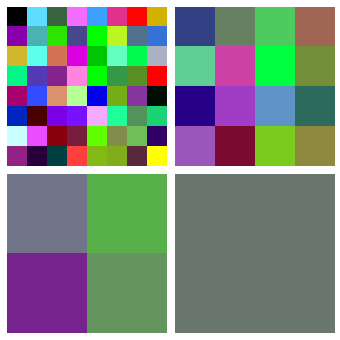

In [3]:
pool = nn.AvgPool2d(2)
T0 = torch.randn(10000, 3, 8, 8)
T1 = pool(T0)
T2 = pool(T1)
T3 = pool(T2)

fig, axes = plt.subplots(2, 2, figsize=(6, 6))
fig.subplots_adjust(wspace=.0, hspace=.05)
for i, v in enumerate([T0, T1, T2, T3]):
    axes.flat[i].axis('off')
    axes.flat[i].imshow((v[0] * .5 + .5).clip(0, 1).movedim(-3, -1))

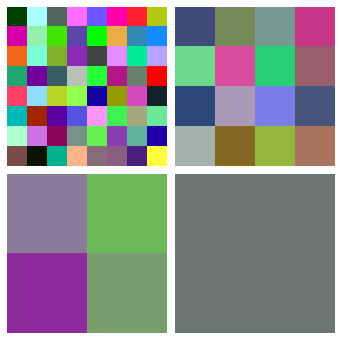

In [4]:
rs = lambda x, s=8: resize(x, s, InterpolationMode.NEAREST)
D0 = T0 - rs(T1)
D1 = T1 - rs(T2, 4)
D2 = T2 - rs(T3, 2)

fig, axes = plt.subplots(2, 2, figsize=(6, 6))
fig.subplots_adjust(wspace=.0, hspace=.05)
for i, v in enumerate([D0, D1, D2, T3]):
    axes.flat[i].axis('off')
    axes.flat[i].imshow((v[0] * .5 + .5).clip(0, 1).movedim(-3, -1))

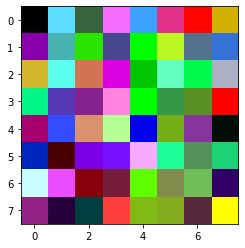

In [5]:
plt.imshow(((rs(T3) + rs(D2) + rs(D1) + rs(D0))[0] * .5 + .5).clip(0, 1).movedim(-3, -1))

In [6]:
T1.var()

tensor(0.2493)

In [7]:
calc = [v.var().item() for v in [T0, T1, T2, T3, D0, D1, D2]]
expected = [1, 1/4, 1/16, 1/64, (1 - 1/4), (1/4 - 1/16), (1/16 - 1/64)]

for c, e in zip(calc, expected):
    print(*map(lambda v: f'{v:.4f}', [c, e]))

1.0011 1.0000
0.2493 0.2500
0.0624 0.0625
0.0155 0.0156
0.7518 0.7500
0.1869 0.1875
0.0469 0.0469


In [8]:
def display_video(path, loop=True):
    mp4 = open(path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    display.display(display.HTML(f'''<video src="{
        data_url}" controls=true autoplay=true {
        "loop=true " if loop else ""}/>'''))

uniform_std = 1 / (2 * 3**.5)

class ZoomNoise():
    def __init__(self, w, h):
        self.w, self.h = w, h
        self.noise_larger = torch.rand(3, h * 2, w * 2)
        # random
        # self.noise_smaller = torch.rand(3, h * 2, w * 2)
        # random walk from cropped larger
        crop_x, crop_y = w // 2, h // 2
        self.noise_smaller = resize(self.noise_larger[:, crop_y:crop_y + h, crop_x:crop_x + w], (h * 2, w * 2))
        #self.noise_smaller = torch.lerp(self.noise_smaller, torch.rand(3, h * 2, w * 2), 0.25)
        self.noise_smaller = .5 + (self.noise_smaller - .5) * uniform_std / 2 + (torch.rand(3, h * 2, w * 2) - .5) * (1 - uniform_std / 2)

        self.zoom_int = 0
    
    def sample(self, t):
        # zoom level transition
        if self.zoom_int != int(t):
            self.zoom_int = int(t)
            temp = self.noise_larger
            self.noise_larger = self.noise_smaller
            # loop
            # self.noise_smaller = temp
            # random
            # self.noise_smaller = torch.rand(3, self.h * 2, self.w * 2)
            # random walk from larger
            w, h = self.w, self.h
            crop_x, crop_y = w // 2, h // 2
            self.noise_smaller = resize(temp[:, crop_y:crop_y + h, crop_x:crop_x + w], (h * 2, w * 2))
            #self.noise_smaller = torch.lerp(self.noise_smaller, torch.rand(3, h * 2, w * 2), 0.25)
            self.noise_smaller = .5 + (self.noise_smaller - .5) * uniform_std / 2 + (torch.rand(3, h * 2, w * 2) - .5) * (1 - uniform_std / 2)
        
        large_w = round(self.w * 2**(t%1 + 1))
        large_h = round(self.h * 2**(t%1 + 1))
        small_w = round(self.w * 2**(t%1))
        small_h = round(self.h * 2**(t%1))
        large_rs = resize(self.noise_larger, (large_h, large_w))
        small_rs = resize(self.noise_smaller, (small_h, small_w))
        large_cx = round(large_w / 2 - self.w / 2)
        large_cy = round(large_h / 2 - self.h / 2)
        small_cx = round(small_w / 2 - self.w / 2)
        small_cy = round(small_h / 2 - self.h / 2)
        large_crop = large_rs[:, large_cy:large_cy + self.h, large_cx:large_cx + self.w]
        small_crop = small_rs[:, small_cy:small_cy + self.h, small_cx:small_cx + self.w]
        lerped = torch.lerp(large_crop, small_crop, t%1)
        # re-norm
        lerped -= .5
        return .5 + lerped * uniform_std / lerped.std()

def sz_make_frame(t, zn):
    frame = resize(zn.sample(t * 2), 512).movedim(-3, -1)
    return frame.clip(0, 1).multiply(255).int().numpy()

os.makedirs('stablezoom', exist_ok=True)
zn = ZoomNoise(256, 256)
clip = mpy.VideoClip(lambda t: sz_make_frame(t, zn), duration=10)
clip.write_videofile('stablezoom/test.mp4', fps=24)
display_video('stablezoom/test.mp4')

Moviepy - Building video stablezoom/test.mp4.
Moviepy - Writing video stablezoom/test.mp4



Moviepy - Done !
Moviepy - video ready stablezoom/test.mp4


In [9]:
a = torch.sparse_coo_tensor(size=(3,)+(10,)*2)
idx = torch.tensor([[1,2],[3,4]]).long()
idx = idx[None].expand(3, -1, -1)
#a.gather(0, idx)

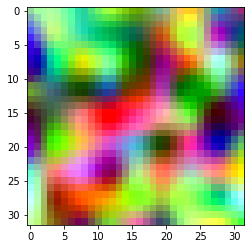

In [10]:
class StableNoise():
    def __init__(self, res=32):
        # generate noise values at first index request and store them
        # self.max_idx = 10000
        # self.noise = torch.sparse_coo_tensor(size=(self.max_idx,) * 3)
        self.noise = {}
        self.x = 0
        self.y = 0
        self.zoom = 1
        self.res = res
    
    # todo: use sparse tensors
    
    def get_noise_int(self, i, j, k):
        if self.noise.get(i) is None:
            self.noise[i] = {}
        if self.noise[i].get(j) is None:
            self.noise[i][j] = {}
        if self.noise[i][j].get(k) is None:
            self.noise[i][j][k] = torch.randn(3)
        return self.noise[i][j][k]
    
    def get_noise(self, x, y, z):
        n00 = self.get_noise_int(x // 1    , y // 1    , z // 1)
        n01 = self.get_noise_int(x // 1    , y // 1 + 1, z // 1)
        n10 = self.get_noise_int(x // 1 + 1, y // 1    , z // 1)
        n11 = self.get_noise_int(x // 1 + 1, y // 1 + 1, z // 1)
        n0 = n00 * (1 - y % 1) + n01 * (y % 1)
        n1 = n10 * (1 - y % 1) + n11 * (y % 1)
        return n0 * (1 - x % 1) + n1 * (x % 1)
    
    def get_image(self):
        w = self.res - 1
        gx, gy = torch.meshgrid(torch.linspace(-w/2, w/2, self.res),
                                torch.linspace(-w/2, w/2, self.res), indexing='xy')
        coords = torch.stack([gx, gy], dim=-1)
        coords[..., 0] += self.x
        coords[..., 1] += self.y
        coords /= 4
        
        img = torch.empty(self.res, self.res, 3)
        for i in range(self.res):
            for j in range(self.res):
                coord = coords[i, j]
                img[i][j] = self.get_noise(coord[0].item(), coord[1].item(), 0)
        return img.movedim(-1, -3)

sn = StableNoise()
plt.imshow((sn.get_image() * .5 + .5).clip(0, 1).movedim(-3, -1))

In [11]:
def sn_make_frame(t, sn):
    sn.x = np.sin(t * np.pi / 2) * 8
    sn.y = np.cos(t * np.pi / 2) * 4
    frame = resize(sn.get_image() * .5 + .5, 512,
                   interpolation=InterpolationMode.NEAREST).movedim(-3, -1)
    return frame.clip(0, 1).multiply(255).int().numpy()

os.makedirs('stable-noise', exist_ok=True)
clip = mpy.VideoClip(lambda t: sn_make_frame(t, sn), duration=4)
clip.write_videofile('stable-noise/test.mp4', fps=24)
display_video('stable-noise/test.mp4')

Moviepy - Building video stable-noise/test.mp4.
Moviepy - Writing video stable-noise/test.mp4



Moviepy - Done !
Moviepy - video ready stable-noise/test.mp4
